Applicant Name: Li Liu

Date: 3/8/2019

### CALL VOLUME ESTIMATION PROJECT


Description:

Data: 3000 customers with `ID`, `name`, `address`, `age`

X: `Feature1` - `Feature24`

y: `current month` contains the number of minutes an individual spent on calls this month

Task: predict y

Questions:
1. Of the attributes provided for each user, which subset of attributes is most predictive to estimate the Call Volume for the current month
2. To better predict the Call Volume, which set of given attributes would you explore to make new features and why?
3. Which different models did you applied and which one performed the best to estimate the Call Volume?
4. Can you show that you are not overfitting? What steps did you took to avoid overfitting.

### Import packages

In [91]:
import numpy as np
import pandas as pd 
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")
import gender_guesser.detector as gender
import plotly
import plotly.plotly as py
plotly.tools.set_credentials_file(username='lliu95877', api_key='YFckxswGtCktzNhNV6Jk')
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, AdaBoostRegressor
from sklearn.linear_model import LinearRegression, Ridge, Lasso, ElasticNet
from sklearn.model_selection import train_test_split, KFold, cross_val_score
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import RandomizedSearchCV, GridSearchCV
from sklearn.preprocessing import StandardScaler
from scipy.stats import randint as sp_randint

### Import data 

In [92]:
df=pd.read_excel("data_candidate2.xlsx")
df.head(2)

,ID,Name,Address,Age,Feature1,Feature2,Feature3,Feature4,Feature5,Feature6,...,Feature16,Feature17,Feature18,Feature19,Feature20,Feature21,Feature22,Feature23,Feature24,Current Month
0,1,Renee Horne,"610 Julie Forges Suite 389\nPort Bryan, UT 15509",65,2659.432,3629.1365,2775.4065,2515.4573,2314.9097,2403.5557,...,1910.7119,NaN,2555.2510,2082.2104,2209.1255,2862.3804,NaN,3034.0947,NaN,2291.8096
1,2,Tina Clark,3094 Thomas Station Suite 903\nLake Michaelshi...,36,NaN,3347.3477,NaN,2511.7124,2979.6692,3195.0806,...,NaN,2756.216,2435.9326,NaN,NaN,2565.6840,3840.0684,2670.0857,2629.6519,3591.0525


In [93]:
#Statistics table
df.describe()

,ID,Age,Feature1,Feature2,Feature3,Feature4,Feature5,Feature6,Feature7,Feature8,...,Feature16,Feature17,Feature18,Feature19,Feature20,Feature21,Feature22,Feature23,Feature24,Current Month
count,3000.000000,3000.000000,2387.000000,2394.000000,2406.000000,2387.000000,2389.000000,2382.000000,2351.000000,2425.000000,...,2382.000000,2390.000000,2389.000000,2417.000000,2405.000000,2442.000000,2427.000000,2412.000000,2433.000000,3000.000000
mean,1500.500000,52.520667,2696.605254,2685.254696,2699.103467,2707.799954,2686.192685,2699.022008,2697.802522,2681.903461,...,2696.843490,2689.099144,2705.572670,2694.308083,2693.658796,2695.328155,2690.090441,2691.324944,2683.656697,2849.121100
std,866.169729,18.001822,495.816554,493.728343,492.130954,493.959672,501.390813,486.619628,491.108293,481.709156,...,509.770460,480.481978,505.632984,489.363349,491.542653,493.897475,501.360013,488.154226,496.821373,645.226321
min,1.000000,22.000000,774.940730,917.034670,1184.512500,841.262940,953.660400,1094.421900,500.000000,1025.271100,...,960.255740,1193.193100,855.692000,812.404200,1127.011400,1004.498960,1185.388300,1204.987800,1001.619200,500.000000
25%,750.750000,37.000000,2355.247800,2348.326175,2370.606175,2364.853900,2338.680400,2377.813750,2370.194000,2361.205300,...,2341.329550,2364.661850,2357.596000,2367.231400,2374.771000,2372.810250,2353.270050,2365.796550,2351.304000,2410.389900
50%,1500.500000,52.000000,2697.799000,2682.757800,2700.049350,2709.467500,2678.384300,2698.547100,2708.198500,2677.394000,...,2700.697600,2687.847550,2713.812000,2688.659000,2704.119400,2701.789300,2703.094000,2691.176750,2676.402000,2831.518500
75%,2250.250000,69.000000,3018.294900,3010.716350,3026.646200,3050.505600,3015.909400,3032.647350,3038.937300,3009.365200,...,3034.166125,3010.984050,3047.092500,3018.091800,3025.438500,3026.612575,3023.369750,3019.598600,2989.959000,3278.422075
max,3000.000000,83.000000,5000.000000,4637.975600,4382.175300,4406.342300,4978.585400,4345.593800,4175.650000,4586.699000,...,4662.434600,4406.956500,4493.093000,4180.402300,4313.878400,4783.111000,4368.586000,4343.590000,4536.105500,5000.000000


### Exploratory Data Analysis

#### Distribution of `Current Month`

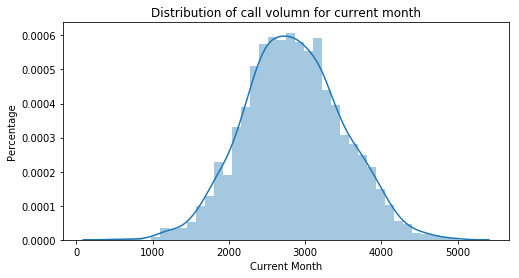

In [94]:
fig, ax = plt.subplots(figsize=(8, 4))
sns.distplot(df['Current Month'],ax=ax)
plt.title("Distribution of call volumn for current month")
plt.ylabel("Percentage")
plt.show()

`Current Month` looks like normal distributed. The mean is 2849 and standard deviation is 245.

#### Boxplot for `Feature 1` - `Feature 24`

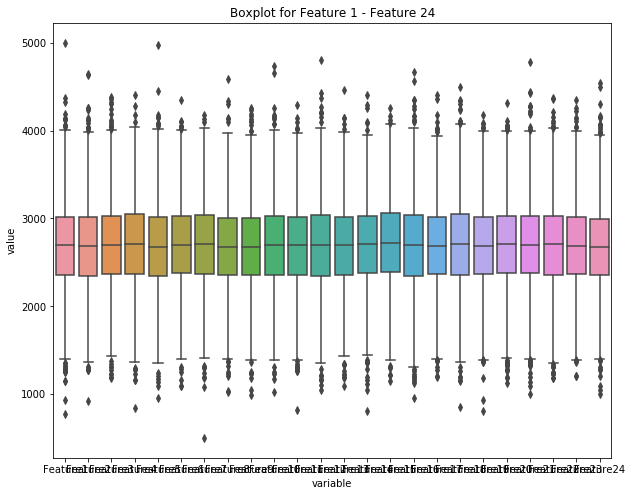

In [95]:
X=df.loc[:,"Feature1":"Feature24"]
fig, ax = plt.subplots(figsize=(10,8))
sns.boxplot(x="variable", y="value", data=pd.melt(X))
plt.title("Boxplot for Feature 1 - Feature 24")
plt.show()

The 24 features have very close interquartile ranges, median, maximum, and minimum. However, some features seem to have more outliers than others.

#### Get States from `Address`

In [138]:
#Plot a choropleth map using plotly package
def get_state_abb(df):
    return df.Address.split()[-2]
df['State']=df.apply(get_state_abb,axis=1)
states=df.groupby('State').agg({'ID':'size','Age':'mean','Current Month':'mean'})
states=states.round(2)
states['Region']=states.index

for col in states.columns:
    states[col] = states[col].astype(str)

states['text'] = 'Counts: '+states['ID'] + '<br>'+\
                 'Age: '+ states['Age']

data = [ dict(type='choropleth', autocolorscale = True,
        locations = states['Region'], z = states['Current Month'].astype(float),
        locationmode = 'USA-states', text = states['text'],
        marker = dict(line = dict(color = 'rgb(255,255,255)',width = 2)),
        colorbar = dict(title = "Values")) ]

layout = dict(title = 'Spatial Distribution of Call Volume for Current Month',
        geo = dict(scope='usa',projection=dict( type='albers usa' ),
            showlakes = True,lakecolor = 'rgb(255, 255, 255)'),)
    
fig = dict( data=data, layout=layout )
py.iplot(fig, filename='states-map')

#### Joint Distribution of X and y

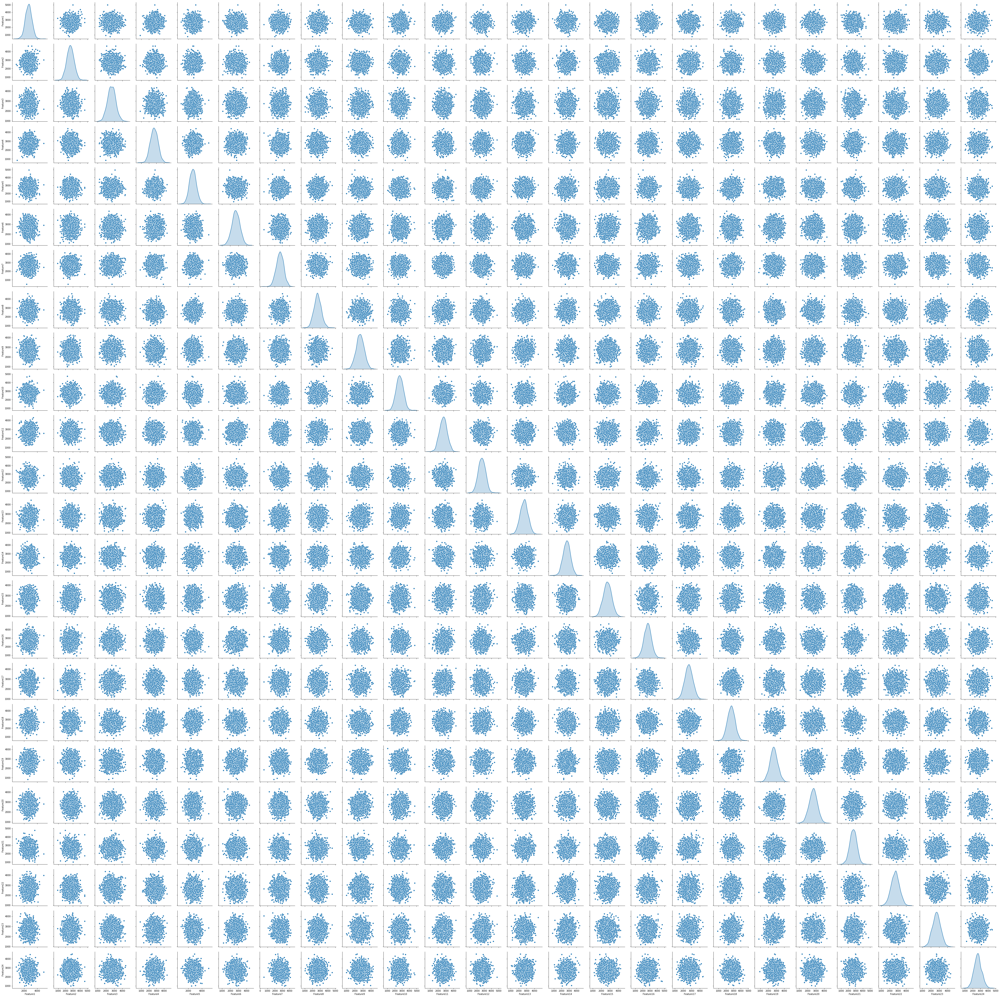

In [97]:
sns.pairplot(X, diag_kind="kde")

#### Heatmap of Correlation Coefficients among X and y

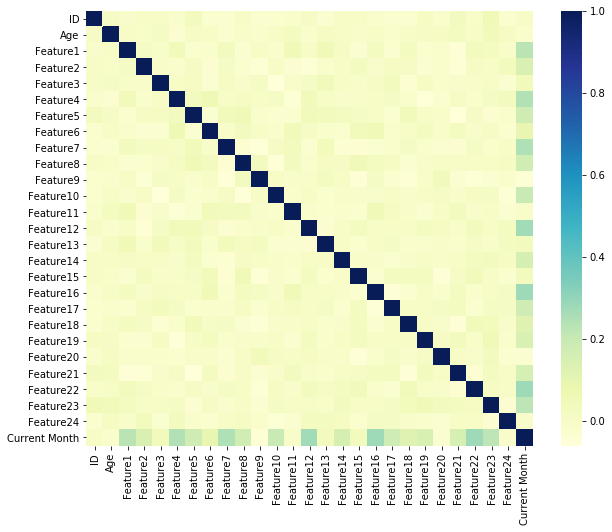

In [98]:
plt.figure(figsize=(10,8))
sns.heatmap(df.corr(), annot=False, cmap="YlGnBu")

### Data Imputation

In [99]:
#Number of missing values in each column
np.sum(X.isnull(),axis=0).mean()

599.0416666666666

Each column has around 600 missing values. We miss 20% of the customers for each feature on average.

In [100]:
#Number of missing values in each column
np.sum(X.isnull(),axis=1).mean()

4.792333333333334

Each row has around 5 missing values. We miss 24% of the features (months) for each customer on average.

It's too costly to ignore all of the missing values. 

My startegy is to impute the missing values by the state-level mean of certain month's call volumn.

In [101]:
#Get state-level mean of certain month's call volumn 
features=[i for i in df.columns[4:28]]
means=df.groupby("State")[features].mean()
means["State"]=means.index
means.head()

,Feature1,Feature2,Feature3,Feature4,Feature5,Feature6,Feature7,Feature8,Feature9,Feature10,...,Feature16,Feature17,Feature18,Feature19,Feature20,Feature21,Feature22,Feature23,Feature24,State
State,,,,,,,,,,,,,,,,,,,,,
AA,2635.230683,2548.103201,2727.967653,2709.474269,2653.855756,2677.979806,2724.827151,2605.838322,2565.430945,2726.811052,...,2648.559593,2764.581038,2724.472676,2759.619659,2738.652709,2723.015520,2764.499786,2654.410271,2557.336402,AA
AE,2647.981168,2733.096033,2696.010325,2668.989144,2639.870094,2586.292340,2758.390644,2596.843189,2746.561425,2672.061409,...,2686.252406,2644.438964,2718.112596,2648.700820,2661.816336,2750.462840,2702.972290,2718.791091,2765.066326,AE
AK,2697.843913,2755.307057,2584.627081,2783.757542,2696.437092,2712.250183,2649.834613,2676.550533,2619.041340,2779.154233,...,2602.959605,2650.952678,2728.699458,2726.569624,2664.542398,2627.596676,2614.248557,2713.285045,2767.998974,AK
AL,2739.151631,2684.220297,2811.207848,2688.170650,2667.102657,2696.622334,2743.775702,2630.358009,2575.420365,2747.303058,...,2613.640130,2721.196969,2613.121704,2815.154976,2789.900988,2681.109429,2633.540546,2798.287133,2511.094746,AL
AP,2644.933312,2650.342895,2605.839928,2675.719108,2659.700700,2697.559320,2734.928129,2677.592119,2694.214916,2647.259970,...,2788.356786,2660.871300,2716.771649,2702.263286,2644.426291,2754.678610,2726.554108,2747.949554,2722.419452,AP


In [102]:
#Impute values from state-level and feature-specific means
for i in range(24):
    #Fetch the indexes of missing values at given feature column
    missingindex=X[X[features[i]].isnull()==True].index
    
    for j in missingindex:
        #Find the associated state abbreviation
        ste=df.iloc[j]["State"]
        #Find the associated mean value
        val=means[features[i]].loc[ste]
        #Set the value
        X=X.set_value(j,features[i],val)

### Feature Engineering

#### Get Gender from First Name

In [103]:
def get_firstname(df):
    return df.Name.split()[0]
df['firstname']=df.apply(get_firstname,axis=1)
guess=gender.Detector()
df["guess"]=[guess.get_gender(i) for i in df['firstname']]
df['Gender']=np.where(df["guess"].str.contains("female"), 1, 0)
print("Ratio of females inferred from the names:",
      df['Gender'].sum()/df.shape[0])

#X['Gender']=df['Gender']

Ratio of females inferred from the names: 0.484


#### Dummy Variable for Young Customers

In [104]:
#X["Young"]=1 if the age is lower than the median age
#X["Young"]=np.where(df["Age"]<52, 1,0)

### Machine Learning Models

In [105]:
#Standardize Features
X_std=StandardScaler().fit_transform(X)

#Split 80% of the data to training set and 20% to testing set
X_train, X_test, y_train, y_test = train_test_split(X_std, df['Current Month'], 
                                                    test_size = 0.20, random_state=10)

##### Decision Tree

In [106]:
tre = DecisionTreeRegressor(max_depth=3, min_samples_leaf=5).fit(X_train,y_train)

In [107]:
#Randomized Search for best parameters

param_dist1 = {'max_depth': sp_randint(2, 100),
               'min_samples_split': sp_randint(2, 100),
               'min_samples_leaf': sp_randint(2, 100)}

random_search1 = RandomizedSearchCV(tre, param_distributions=param_dist1,
                       n_iter=100, n_jobs=-1, cv=5, random_state=10,
                       scoring='neg_mean_squared_error').fit(X_train,y_train)
print('RandBestEstimator1=', random_search1.best_estimator_)
print('RandBestParams1=', random_search1.best_params_)
print('RandBestScore1=', -random_search1.best_score_)

RandBestEstimator1= DecisionTreeRegressor(criterion='mse', max_depth=34, max_features=None,
           max_leaf_nodes=None, min_impurity_decrease=0.0,
           min_impurity_split=None, min_samples_leaf=83,
           min_samples_split=82, min_weight_fraction_leaf=0.0,
           presort=False, random_state=None, splitter='best')
RandBestParams1= {'max_depth': 34, 'min_samples_leaf': 83, 'min_samples_split': 82}
RandBestScore1= 372648.18782340124


In [108]:
para0=random_search1.best_params_
tre_best = DecisionTreeRegressor(max_depth=para0['max_depth'], 
                                 min_samples_leaf=para0['min_samples_leaf'],
                                 min_samples_split=para0['min_samples_split']
                                 ).fit(X_train,y_train)
trebestkf=cross_val_score(tre_best, X_train, y_train, cv=5, 
                      scoring="neg_mean_squared_error")
print("Mean:",round(-trebestkf.mean(),2))
print("Standard deviation:",round(trebestkf.std(),2))

Mean: 372648.19
Standard deviation: 19815.82


##### Random Forest

In [109]:
rfc= RandomForestRegressor().fit(X_train, y_train)

In [112]:
#Randomized Search for best parameters

param_dist2 = {'n_estimators':[20,100],
               'max_depth': [3,20],
               'min_samples_split': sp_randint(2, 100),
               'min_samples_leaf': sp_randint(2, 100),
               'max_features':sp_randint(5,24)}

random_search2 = RandomizedSearchCV(rfc, param_distributions=param_dist2,
                       n_iter=100, n_jobs=-1, cv=5, random_state=10,
                       scoring='neg_mean_squared_error').fit(X_train,y_train)

print('RandBestEstimator2=', random_search2.best_estimator_)
print('RandBestParams2=', random_search2.best_params_)
print('RandBestScore2=', -random_search2.best_score_)

RandBestEstimator2= RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=20,
           max_features=10, max_leaf_nodes=None, min_impurity_decrease=0.0,
           min_impurity_split=None, min_samples_leaf=2,
           min_samples_split=20, min_weight_fraction_leaf=0.0,
           n_estimators=100, n_jobs=None, oob_score=False,
           random_state=None, verbose=0, warm_start=False)
RandBestParams2= {'max_depth': 20, 'max_features': 10, 'min_samples_leaf': 2, 'min_samples_split': 20, 'n_estimators': 100}
RandBestScore2= 272600.279645182


In [113]:
para=random_search2.best_params_
rfc_best = RandomForestRegressor(n_estimators=para['n_estimators'], 
                                 max_depth=para['max_depth'], 
                                 min_samples_leaf=para['min_samples_leaf'], 
                                 min_samples_split=para['min_samples_split'], 
                                 max_features=para['max_features']).fit(X_train,y_train)
rfcbestkf=cross_val_score(rfc_best, X_train, y_train, cv=5, 
                      scoring="neg_mean_squared_error")
print("Mean:",round(-rfcbestkf.mean(),2))
print("Standard deviation:",round(rfcbestkf.std(),2))

Mean: 271081.12
Standard deviation: 14572.52


In [114]:
for name,score in zip(features,rfc_best.feature_importances_):
    print(name,score)

Feature1 0.06295633246159137
Feature2 0.030594761467986134
Feature3 0.015079851031938292
Feature4 0.06756599256432361
Feature5 0.044578889991358374
Feature6 0.01817570177904222
Feature7 0.0800298217004135
Feature8 0.03547376486350481
Feature9 0.01571479084214283
Feature10 0.05438203214931999
Feature11 0.01702031601352304
Feature12 0.08053400641563659
Feature13 0.016477521603546014
Feature14 0.03884471126697434
Feature15 0.013977705291315203
Feature16 0.09252615565858108
Feature17 0.04548016152876885
Feature18 0.02759568682737059
Feature19 0.03205580117129775
Feature20 0.015718862159007942
Feature21 0.03642779464813586
Feature22 0.08818304907287108
Feature23 0.052813037535583744
Feature24 0.017793251955766726


##### Gradient Boosting

In [115]:
gra = GradientBoostingRegressor(min_samples_split=26, max_features=6,
                                max_depth=40, min_samples_leaf=9,
                                random_state=10).fit(X_train,y_train)                            

In [116]:
grakf=cross_val_score(gra, X_train, y_train, cv=5, 
                      scoring="neg_mean_squared_error")
print("Mean:",round(-grakf.mean(),2))
print("Standard deviation:",round(grakf.std(),2))

Mean: 248196.08
Standard deviation: 14270.32


##### AdaBoost

In [117]:
ada = AdaBoostRegressor(rfc_best, random_state=10).fit(X_train,y_train)

In [118]:
adakf=cross_val_score(ada, X_train, y_train, cv=5, 
                      scoring="neg_mean_squared_error")
print("Mean:",round(-adakf.mean(),2))
print("Standard deviation:",round(adakf.std(),2))

Mean: 242740.49
Standard deviation: 13870.14


##### Ridge Regression

In [119]:
rid = Ridge(alpha=1).fit(X_train, y_train)

In [120]:
#Run grid search hyperparameter search

alpha_grid={"alpha":np.linspace(1,50,1000)}
grid_search1 = GridSearchCV(rid, param_grid=alpha_grid,
                       n_jobs=-1, cv=5,
                       scoring='neg_mean_squared_error').fit(X_train,y_train)
print('GridBestEstimator=', grid_search1.best_estimator_)
print('GridBestParams=', grid_search1.best_params_)
print('GridBestScore=', -grid_search1.best_score_)

GridBestEstimator= Ridge(alpha=18.06906906906907, copy_X=True, fit_intercept=True, max_iter=None,
   normalize=False, random_state=None, solver='auto', tol=0.001)
GridBestParams= {'alpha': 18.06906906906907}
GridBestScore= 193613.96458343675


In [121]:
rid_best = Ridge(alpha=grid_search1.best_params_['alpha']).fit(X_train, y_train)
ridbestkf=cross_val_score(rid_best, X_train, y_train, cv=5, 
                      scoring="neg_mean_squared_error")
print("Mean:",round(-ridbestkf.mean(),2))
print("Standard deviation:",round(ridbestkf.std(),2))

Mean: 193613.96
Standard deviation: 12463.07


##### Lasso Regression

In [122]:
las = Lasso().fit(X_train, y_train)

In [123]:
# Run grid search hyperparameter search
alpha_grid={"alpha":np.linspace(1,5,200)}
grid_search2 = GridSearchCV(las, param_grid=alpha_grid,
                       n_jobs=-1, cv=5,
                       scoring='neg_mean_squared_error').fit(X_train,y_train)
print('GridBestEstimator=', grid_search2.best_estimator_)
print('GridBestParams=', grid_search2.best_params_)
print('GridBestScore=', -grid_search2.best_score_)

GridBestEstimator= Lasso(alpha=2.467336683417085, copy_X=True, fit_intercept=True, max_iter=1000,
   normalize=False, positive=False, precompute=False, random_state=None,
   selection='cyclic', tol=0.0001, warm_start=False)
GridBestParams= {'alpha': 2.467336683417085}
GridBestScore= 193465.94970221867


In [140]:
err=[]
for i in np.linspace(1,5,200):
    model=Lasso(alpha=i).fit(X_train, y_train)
    kf=cross_val_score(model, X_train, y_train, cv=5, 
                      scoring="neg_mean_squared_error")
    err.append(-kf.mean())

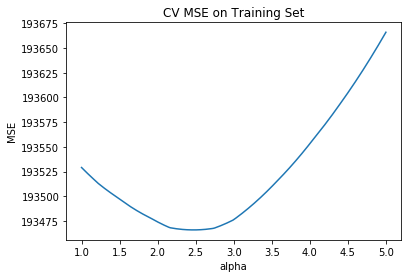

In [143]:
plt.plot(np.linspace(1,5,200),err)
plt.title("CV MSE on Training Set")
plt.xlabel("alpha")
plt.ylabel("MSE")
plt.show()

In [134]:
las_best = Lasso(alpha=grid_search2.best_params_['alpha']).fit(X_train, y_train)
lasbestkf=cross_val_score(las_best, X_train, y_train, cv=5, 
                      scoring="neg_mean_squared_error")
print("Mean:",round(-lasbestkf.mean(),2))
print("Standard deviation:",round(lasbestkf.std(),2))

Mean: 193465.95
Standard deviation: 12585.0


In [135]:
las_best.intercept_

2851.659459414562

In [136]:
las_best.coef_

array([120.12490249,  89.79447795,  26.19366499, 130.44093627,
        96.67277168,  45.54324837, 138.80789573, 101.80751623,
        -3.60483496, 118.46097229,  -2.85787651, 135.98873725,
        11.04001764,  91.58097554,   1.85495828, 159.78149587,
       110.65893618,  76.40996429,  81.51429081,  -3.90804856,
       104.75287369, 150.95386959, 108.34938479,  -1.93943578])

##### Elastic Net

In [129]:
ela = ElasticNet(alpha=0.1,l1_ratio=0.5).fit(X_train, y_train)

In [130]:
# Run grid search hyperparameter search
alpha_ratio_grid={"alpha":np.linspace(1,5,50),
                  "l1_ratio":np.linspace(0,1,10)}
grid_search3 = GridSearchCV(ela, param_grid=alpha_ratio_grid,
                       n_jobs=-1, cv=5,
                       scoring='neg_mean_squared_error').fit(X_train,y_train)
print('GridBestEstimator=', grid_search3.best_estimator_)
print('GridBestParams=', grid_search3.best_params_)
print('GridBestScore=', -grid_search3.best_score_)

GridBestEstimator= ElasticNet(alpha=2.4693877551020407, copy_X=True, fit_intercept=True,
      l1_ratio=1.0, max_iter=1000, normalize=False, positive=False,
      precompute=False, random_state=None, selection='cyclic', tol=0.0001,
      warm_start=False)
GridBestParams= {'alpha': 2.4693877551020407, 'l1_ratio': 1.0}
GridBestScore= 193465.9494092393


In [131]:
ela_best = ElasticNet(alpha=grid_search3.best_params_['alpha'],
                      l1_ratio=grid_search3.best_params_['l1_ratio']).fit(X_train, y_train)
elabestkf=cross_val_score(ela_best, X_train, y_train, cv=5, 
                      scoring="neg_mean_squared_error")
print("Mean:",round(-elabestkf.mean(),2))
print("Standard deviation:",round(elabestkf.std(),2))

Mean: 193465.95
Standard deviation: 12585.08


Grid search selects l1_raio to be 1, which is equivalent to Lasso regression.

#### Models Comparsion

In [160]:
results=pd.DataFrame({"CV MSE":[-trebestkf.mean(),-rfcbestkf.mean(),-grakf.mean(),
                        -adakf.mean(),-ridbestkf.mean(),-lasbestkf.mean(), -elabestkf.mean()],
              "CV Std":[trebestkf.std(),rfcbestkf.std(),grakf.std(),
                        adakf.std(),ridbestkf.std(),lasbestkf.std(), elabestkf.std()]},
             index=["Regression Tree","Random Forest","Gradient Boosting",
                   "AdaBoost", "Ridge Regression", "Lasso Regression", "Elastic Net"])
results.round(2)

,CV MSE,CV Std
Regression Tree,372648.19,19815.82
Random Forest,271081.12,14572.52
Gradient Boosting,248196.08,14270.32
AdaBoost,242740.49,13870.14
Ridge Regression,193613.96,12463.07
Lasso Regression,193465.95,12585.00
Elastic Net,193465.95,12585.08


#### Performance on Test Set

In [147]:
mean_squared_error(y_test,las_best.predict(X_test))

186049.9849615597

### Save the Optimal Model

In [156]:
from sklearn.externals import joblib
joblib.dump(las_best, 'model.pkl')

['model.pkl']

In [157]:
model= joblib.load('model.pkl')

In [158]:
model.score(X_test, y_test)

0.5559099334449378